<img src ='CCT_logo.jpg'/>

## MSc in Data Analytics ##


### Individual Project CA2

Author:

|Student Name | Student Number | Email address |
|:-|:-:|:-:|
| Vitor Notaro | sba20229 | vitornotaro34@gmail.com 

Lecturer:

|Lecturer Name | Module | Email address |
|:-|:-:|:-:|
| David McQuaid | Data Preparation & Visualisation for Data Analytics | dmcquaid@cct.ie |
| David McQuaid | Programming for Data Analytics | dmcquaid@cct.ie |
| Dr. Muhammad Iqbal | Machine Learning for Data Analytics | miqbal@cct.ie |
| Marina Iantorno | Statistics for Data Analytics | miantorno@cct.ie |

### Table of contents:

1. [CA1 Information](#first-bullet)
2. [Initial Exploratory and Data Analysis](#second-bullet)
3. [Statistics Questions ](#third-bullet)
4. [Folium for Visualization (Dublin Bike Map) ](#fourth-bullet)
5. [Data Preparation and Feature Engineering ](#fiveth-bullet)
6. [Re-Shaping Data and Build M Learning Models ](#sixth-bullet)
7. [Dimensionality Reduction using Principal Components Analyses](#seventh-bullet)
8. [Hierarchy Clustering](#eighth-bullet)
9. [KMeans Clustering](#nineth-bullet)
10. [Comparing models with silhouette score](#tenth-bullet)
11. [Imputing K Means Labels and evaluating results with Data Visualization](#eleventh-bullet)
12. [Conclusions](#twelveth-bullet)
13. [References](#thirteenth-bullet)


##  Initial Exploratory and Data Analysis

In [565]:
# Importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from dataprep.eda import create_report
import datetime as dt
import warnings
warnings.filterwarnings('ignore')
warnings.warn('ignore')

In [566]:
# Using Pandas to read the dataset.
df = pd.read_csv("Datasets/Dataset_DG_AGRI-JRC_-_Production__trade_and_apparent_use__EU-27_.csv")
# Using head() to visualize the top 5 rows
df.head(5)

,Country,Country (NUTS Code),Country (Description),Commodity,Commodity (Type),Commodity (Primary product),Year,Apparent use (THOUSAND TONS),Apparent use (THOUSAND TONS (C.W.E.)),Apparent use (THOUSAND HECTOLITRES),...,Population (THOUSAND HEAD),Production (THOUSAND TONS),Production (THOUSAND HECTOLITRES),Production of primary product (THOUSAND TONS),Production (from dairy cows) (THOUSAND TONS),Yield (animals) (KG/HEAD),Yield (crops) (TONNE/HA),Yield of secondary product (KG PER TONNE OF PRIMARY PRODUCT),Yield (HECTOLITRES PER HECTARE),Yield of primary product (TONNE/HA)
0,Austria,AT,NaN,ACIDIFIED MILK,DAIRY,NaN,2002,139.610841,NaN,NaN,...,NaN,190.69,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Austria,AT,NaN,ACIDIFIED MILK,DAIRY,NaN,2003,146.427460,NaN,NaN,...,NaN,209.20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Austria,AT,NaN,ACIDIFIED MILK,DAIRY,NaN,2004,140.327465,NaN,NaN,...,NaN,216.10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Austria,AT,NaN,ACIDIFIED MILK,DAIRY,NaN,2005,148.229900,NaN,NaN,...,NaN,235.28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Austria,AT,NaN,ACIDIFIED MILK,DAIRY,NaN,2006,163.499156,NaN,NaN,...,NaN,264.78,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [567]:
# Applying filter to select only observations related to Meat.
df= df[df["Commodity (Type)"]=="MEAT"]
# Excluding observations related to the aggregation of the European continent as Europe is not a Country.
df =df[df['Country']!="EU"]

In [568]:
# This method prints information about a DataFrame including the index dtype and columns, non-null values and memory usage
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2160 entries, 41 to 28819
Data columns (total 46 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   Country                                                       2160 non-null   object 
 1   Country (NUTS Code)                                           2160 non-null   object 
 2   Country (Description)                                         0 non-null      object 
 3   Commodity                                                     2160 non-null   object 
 4   Commodity (Type)                                              2160 non-null   object 
 5   Commodity (Primary product)                                   0 non-null      object 
 6   Year                                                          2160 non-null   int64  
 7   Apparent use (THOUSAND TONS)                                  0 non

In [569]:
#Selecting only collumns related to Meat
df = df.loc[:,['Year','Country','Country (NUTS Code)','Commodity','Apparent use (THOUSAND TONS (C.W.E.))','Carcass weight (KG/HEAD)','Gross indigenous production (THOUSAND TONS (C.W.E.))','Live exports (Extra-EU) (THOUSAND TONS (C.W.E.))','Live exports (Intra-EU) (THOUSAND TONS (C.W.E.))','Live imports (Extra-EU) (THOUSAND TONS (C.W.E.))','Live imports (Intra-EU) (THOUSAND TONS (C.W.E.))','Meat exports (Extra-EU) (THOUSAND TONS (C.W.E.))','Meat exports (Intra-EU) (THOUSAND TONS (C.W.E.))','Meat imports (Extra-EU) (THOUSAND TONS (C.W.E.))','Meat imports (Intra-EU) (THOUSAND TONS (C.W.E.))','Net production (heads) (THOUSAND HEAD)','Net production (tons) (THOUSAND TONS (C.W.E.))']]

## Data Exploration

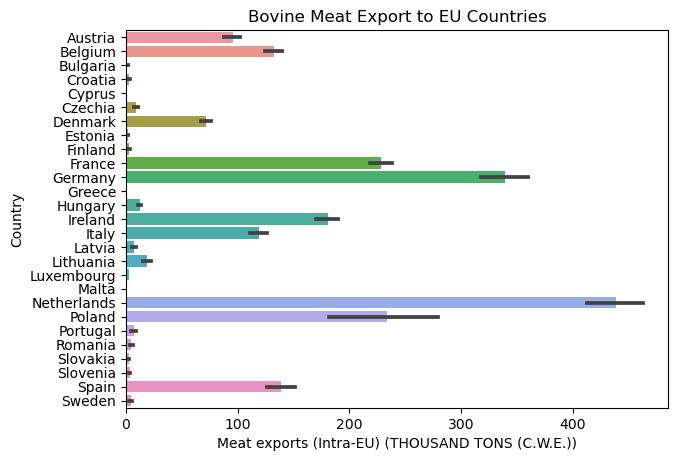

In [570]:
# Applying filter to select only observations related to Meat.
bovine = df[df["Commodity"]=="BOVINE"]
plt.rcParams.update({'figure.figsize':(7,5), 'figure.dpi':100})
sns.barplot(x="Meat exports (Intra-EU) (THOUSAND TONS (C.W.E.))",y='Country',data=bovine).set(title='Bovine Meat Export to EU Countries');

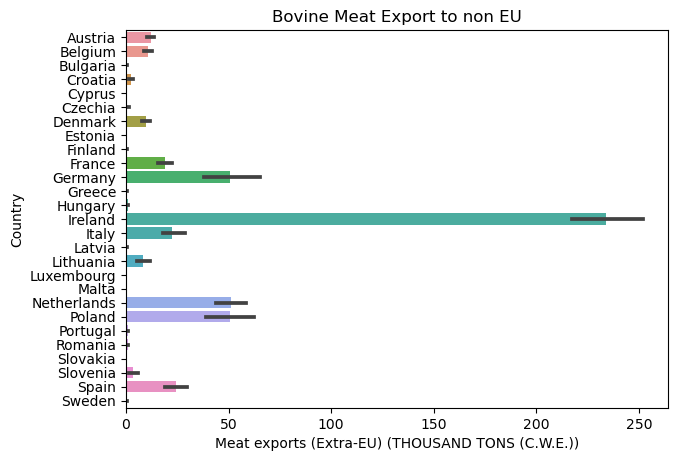

In [571]:
# Applying filter to select only observations related to Meat.
bovine = df[df["Commodity"]=="BOVINE"]
plt.rcParams.update({'figure.figsize':(7,5), 'figure.dpi':100})
sns.barplot(x="Meat exports (Extra-EU) (THOUSAND TONS (C.W.E.))",y='Country',data=bovine).set(title='Bovine Meat Export to non EU');

At present Irish meat is exported to around 70 countries around the world, both within the European Union on general commercial documents and outside the European Union, either on the basis of bilaterally agreed veterinary health certificates, EU health certificates or on general meat certificates.  Products exported include: Beef , Pig meat, Sheep meat, Poultry and Cooked meats

In [572]:
country_codes = pd.read_csv("Datasets/country_codes.tsv", sep='\t')
country_codes.head()

,Country,Alpha-2 code,Alpha-3 code,Numeric
0,Afghanistan,AF,AFG,4
1,Albania,AL,ALB,8
2,Algeria,DZ,DZA,12
3,American Samoa,AS,ASM,16
4,Andorra,AD,AND,20


In [573]:
df = pd.merge(df, country_codes, on="Country", how="left")

In [574]:
df100 = df.pivot_table(index =['Alpha-3 code','Country'],
                       values =["Live imports (Extra-EU) (THOUSAND TONS (C.W.E.))"],
                       aggfunc ='sum').reset_index()

In [575]:
import plotly.express as px
fig = px.choropleth(df100,
                    locations="Alpha-3 code",
                    color="Live imports (Extra-EU) (THOUSAND TONS (C.W.E.))", 
                    # column by which to color-code
                    hover_name="Country", 
                    # column to display in hover information
                    color_continuous_scale=px.colors.sequential.Plasma)
fig.update_layout(
    # add a title text for the plot
    title_text = '',
    geo_scope = 'europe')
fig.show()

To fairly compare the 27 EU countries it will be considered the Farm Structure of each country.
Using the European Comparison Table provided by where it can be founded details about holdings and agricultural area size in the EU Member States.

Unsupervised Machine Learning Models will be applied in order to cluster the Countries based on their Farm Structure.

For this exercise Hierarchical Cluster and KMeans are the selected models once both works based on Euclidean Distance.

In [576]:
# Using Pandas to read the dataset.
df1 = pd.read_csv("Datasets/European Comparison-Farm Structure Survey 2013.csv")
# Using head() to visualize the top 5 rows
df1.head(5)

,Country,Number of holdings (000),Utilised agricultural area (000 hectares),Average area per holding (hectares)
0,EU,"10,841.00","174,606.60",16.1
1,Belgium,37.8,"1,307.90",34.6
2,Bulgaria,254.4,"4,650.90",18.3
3,Czech Republic,26.3,"3,491.50",133.0
4,Denmark,38.8,"2,619.30",67.5


In [577]:
# Removing EU row
df1=df1[df1['Country']!="EU"]

In [578]:
# Replace comma using a Lambda function
df1['Number of holdings (000)'] = df1['Number of holdings (000)'].apply(lambda field: field.replace(",", ""))

In [579]:
# Replace comma using a Lambda function
df1['Utilised agricultural area (000 hectares)'] = df1['Utilised agricultural area (000 hectares)'].apply(lambda field: field.replace(",", ""))

In [580]:
# Reset the index after remove EU row.
df1.reset_index(inplace=True, drop=True)
df1

,Country,Number of holdings (000),Utilised agricultural area (000 hectares),Average area per holding (hectares)
0,Belgium,37.8,1307.90,34.6
1,Bulgaria,254.4,4650.90,18.3
2,Czech Republic,26.3,3491.50,133.0
3,Denmark,38.8,2619.30,67.5
4,Germany,285,16699.60,58.6
5,Estonia,19.2,957.5,49.9
6,Ireland,139.6,4959.40,35.5
7,Greece,709.5,4856.80,6.8
8,Spain,965,23300.20,24.1
9,France,472.2,27739.40,58.7


In [581]:
# Selecting numerical features to applie cluster
df2 = df1[["Average area per holding (hectares)","Utilised agricultural area (000 hectares)","Number of holdings (000)"]]

In [582]:
# Checking Type of each variables
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28 entries, 0 to 27
Data columns (total 3 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   Average area per holding (hectares)        28 non-null     float64
 1   Utilised agricultural area (000 hectares)  28 non-null     object 
 2   Number of holdings (000)                   28 non-null     object 
dtypes: float64(1), object(2)
memory usage: 800.0+ bytes


In [583]:
# Changing objects into float type
df2['Number of holdings (000)'] = df2['Number of holdings (000)'].astype(float)
df2['Utilised agricultural area (000 hectares)'] = df2['Utilised agricultural area (000 hectares)'].astype(float)

Explain Why use Standard Scaler

In [584]:
# Use StandardScaler from Scikit Learn to standardize the features onto unit scale (mean = 0 and standard deviation = 1) 
from sklearn.preprocessing import StandardScaler
data_scaled = StandardScaler().fit_transform(df2)

In [585]:
# array of data set df2 after StandardScaler
data_scaled

array([[ 0.08821495, -0.61621009, -0.48032198],
       [-0.47174753, -0.14205543, -0.17817215],
       [ 3.46860191, -0.30649902, -0.4963641 ],
       [ 1.21844595, -0.43020757, -0.47892702],
       [ 0.91269957,  1.56687286, -0.13548616],
       [ 0.61382389, -0.6659091 , -0.50626837],
       [ 0.11913312, -0.09829931, -0.33831435],
       [-0.86681308, -0.11285159,  0.4566773 ],
       [-0.27249708,  2.50306947,  0.81309134],
       [ 0.91613492,  3.13270375,  0.12565165],
       [-0.75688179, -0.57886491, -0.31348394],
       [-0.68817474,  0.91433223,  0.87628335],
       [-0.99392112, -0.78621361, -0.48366991],
       [-0.31028595, -0.53539246, -0.41894344],
       [-0.52671317, -0.39588348, -0.29339642],
       [ 1.06385509, -0.78313579, -0.5301223 ],
       [-0.77405856, -0.14126115,  0.15229551],
       [-1.05919282, -0.80017019, -0.51993905],
       [-0.15913044, -0.5396617 , -0.43889147],
       [-0.43395865, -0.41494612, -0.33719838],
       [-0.75344644,  1.24211309,  1.460

## Clustering 

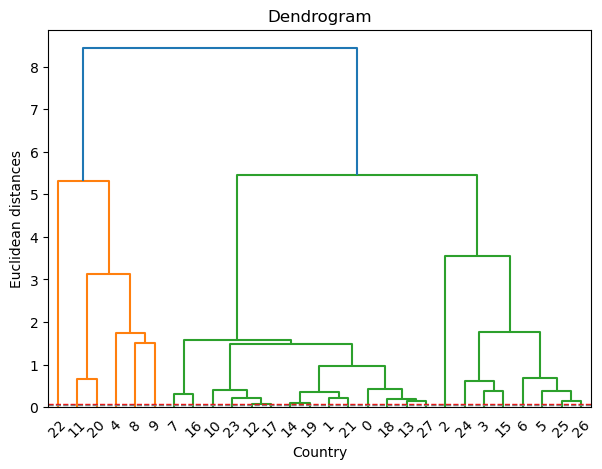

In [586]:
# Using hierarchy to cluster the observations
#importing the library
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
#recovering matplotlib defalts
#plt.rcParams.update(plt.rcParamsDefault)

#Importing scipy.cluster.hierarchy to create dendrogram
import scipy.cluster.hierarchy as sch

dendrogram =sch.dendrogram(sch.linkage(
                data_scaled,method = 'ward'))

#creating the plot, assigning labels and title
plt.title('Dendrogram')
plt.xlabel('Country')
plt.ylabel('Euclidean distances')

# Add horizontal line to visualize .
plt.axhline(y=0.068, c='red', lw=1, linestyle='dashed')
plt.axhline(y=0.05, c='grey', lw=1, linestyle='dashed')

plt.show()

In [587]:
# Including Cluster Labels
# importing the library 
from sklearn.cluster import AgglomerativeClustering
hierarchy_cluster = AgglomerativeClustering(n_clusters=2, affinity="euclidean", linkage="ward")
#create a pandas series to be used latter on
y1 = pd.Series(hierarchy_cluster.fit_predict(data_scaled), name="Cluster Hierarquical")

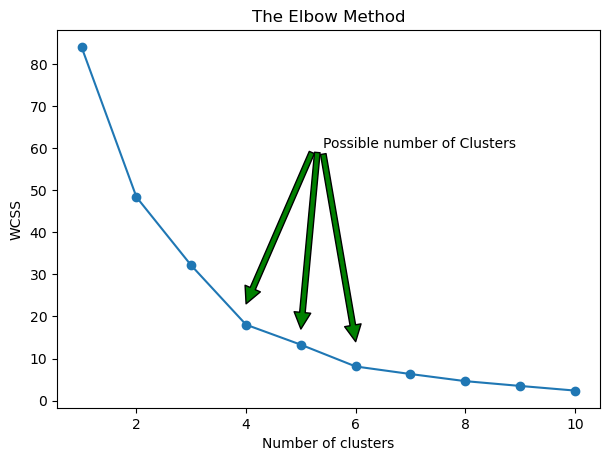

In [588]:
# Plotting Elbow method
import matplotlib.pyplot as plt
#recovering matplotlib defaults
#plt.rcParams.update(plt.rcParamsDefault)

#Using the elbow method to find the optimal number of clusters
from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 0)
    kmeans.fit(data_scaled)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 11),wcss,marker='o')
plt.title('The Elbow Method')
plt.annotate('Possible number of Clusters', xy=(6, 14), xytext=(5.4, 60), arrowprops=dict(facecolor='green'))
plt.annotate("",xy=(4, 23), xytext=(5.2, 59), arrowprops=dict(facecolor='green'))
plt.annotate("",xy=(5, 17), xytext=(5.3, 59), arrowprops=dict(facecolor='green'))
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [589]:
#Importing and Fitting K-Means to dataset
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters = 5, init = 'k-means++', random_state = 0)
y2 = pd.Series(kmeans.fit_predict(data_scaled), name="Cluster KMeans")

## Silhouette Score

In [590]:
# Calculate Silhouette Score kmeans
#importing the library
#from sklearn.metrics import silhouette_score
#score = silhouette_score(data_scaled, kmeans.labels_, metric='euclidean')
#print('Silhouetter Score for 6 clusters : %.3f' % score)

Silhouette Coefficient also know as silhouette score is a metric used to calculate the efficiency of a clustering technique.

Its value ranges from -1 to 1.

1: Means clusters are well apart from each other and clearly distinguished.

0: Means clusters are indifferent, or we can say that the distance between clusters is not significant.

-1: Means clusters are assigned in the wrong way.

In [591]:
#importing the library
from sklearn.metrics import silhouette_score

# Calculate Silhouette Score hierarchy
hierarchy_score = silhouette_score(data_scaled, hierarchy_cluster.labels_, metric='euclidean')
# Print the score
print('Silhouette Score Hierarchy for 2 clusters: %.3f' % hierarchy_score)


# Calculate Silhouette Score KMeans
for i in range(4,7):
    
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 0)
    y2 = pd.Series(kmeans.fit_predict(data_scaled), name="Cluster KMeans")
    score = silhouette_score(data_scaled, kmeans.labels_, metric='euclidean')
    print("Silhouette Score KMeans for "  + str(i) + " clusters : %.3f" % score)

Silhouette Score Hierarchy for 2 clusters: 0.533
Silhouette Score KMeans for 4 clusters : 0.508
Silhouette Score KMeans for 5 clusters : 0.481
Silhouette Score KMeans for 6 clusters : 0.445


The Silhouette Score test suggests Hierarchy with 2 Cluster as the best option with a higher score 

In [592]:
# assigning the Hierarchy cluster labels for each observation in df2
df2 = pd.concat([df1, y1], axis = 1)
df2

,Country,Number of holdings (000),Utilised agricultural area (000 hectares),Average area per holding (hectares),Cluster Hierarquical
0,Belgium,37.8,1307.90,34.6,0
1,Bulgaria,254.4,4650.90,18.3,0
2,Czech Republic,26.3,3491.50,133.0,0
3,Denmark,38.8,2619.30,67.5,0
4,Germany,285,16699.60,58.6,1
5,Estonia,19.2,957.5,49.9,0
6,Ireland,139.6,4959.40,35.5,0
7,Greece,709.5,4856.80,6.8,0
8,Spain,965,23300.20,24.1,1
9,France,472.2,27739.40,58.7,1


## Merging the Two

In [593]:
# Merging the two datasets using Country as a key and left as a join 
new_df = pd.merge(df, df2, on="Country", how="left")

In [594]:
new_df

,Year,Country,Country (NUTS Code),Commodity,Apparent use (THOUSAND TONS (C.W.E.)),Carcass weight (KG/HEAD),Gross indigenous production (THOUSAND TONS (C.W.E.)),Live exports (Extra-EU) (THOUSAND TONS (C.W.E.)),Live exports (Intra-EU) (THOUSAND TONS (C.W.E.)),Live imports (Extra-EU) (THOUSAND TONS (C.W.E.)),...,Meat imports (Intra-EU) (THOUSAND TONS (C.W.E.)),Net production (heads) (THOUSAND HEAD),Net production (tons) (THOUSAND TONS (C.W.E.)),Alpha-2 code,Alpha-3 code,Numeric,Number of holdings (000),Utilised agricultural area (000 hectares),Average area per holding (hectares),Cluster Hierarquical
0,2002,Austria,AT,BOVINE,150.230876,299.546142,221.668323,1.519472,11.760207,0.000000,...,11.016996,707.270000,211.860000,AT,AUT,40.0,140.4,2726.90,19.4,0.0
1,2003,Austria,AT,BOVINE,147.146140,303.832397,217.864637,2.158318,12.495831,0.000000,...,12.660350,684.950000,208.110000,AT,AUT,40.0,140.4,2726.90,19.4,0.0
2,2004,Austria,AT,BOVINE,136.276934,306.036465,214.087118,2.677365,12.945268,0.009130,...,12.675219,674.070000,206.290000,AT,AUT,40.0,140.4,2726.90,19.4,0.0
3,2005,Austria,AT,BOVINE,143.325801,311.445341,208.223687,2.583296,14.606232,0.006534,...,17.915776,654.240000,203.760000,AT,AUT,40.0,140.4,2726.90,19.4,0.0
4,2006,Austria,AT,BOVINE,149.743905,314.283203,225.468730,3.059186,16.224407,0.010588,...,20.968555,682.760000,214.580000,AT,AUT,40.0,140.4,2726.90,19.4,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2155,2017,Sweden,SE,SHEEP AND GOATS,24.280400,20.299524,5.711000,0.000046,0.000001,0.000000,...,15.216473,281.780000,5.720000,SE,SWE,752.0,67.1,3028.60,45.1,0.0
2156,2018,Sweden,SE,SHEEP AND GOATS,19.809945,20.149279,6.015638,0.000226,0.000010,0.000000,...,10.552652,298.770000,6.020000,SE,SWE,752.0,67.1,3028.60,45.1,0.0
2157,2019,Sweden,SE,SHEEP AND GOATS,18.579843,20.403662,5.540064,0.000006,0.000000,0.000000,...,11.184625,272.010000,5.550000,SE,SWE,752.0,67.1,3028.60,45.1,0.0
2158,2020,Sweden,SE,SHEEP AND GOATS,18.244682,20.429443,5.276934,0.000022,0.000000,0.000000,...,10.881833,258.940000,5.290000,SE,SWE,752.0,67.1,3028.60,45.1,0.0


As previous seen Ireland belongs to the Cluster 0, for that reason Cluster one will be ignored for next steps.

In [595]:
# New dataframe with only cluster 0
list_country_1 = new_df[new_df["Cluster Hierarquical"] == 0]
list_country_1

,Year,Country,Country (NUTS Code),Commodity,Apparent use (THOUSAND TONS (C.W.E.)),Carcass weight (KG/HEAD),Gross indigenous production (THOUSAND TONS (C.W.E.)),Live exports (Extra-EU) (THOUSAND TONS (C.W.E.)),Live exports (Intra-EU) (THOUSAND TONS (C.W.E.)),Live imports (Extra-EU) (THOUSAND TONS (C.W.E.)),...,Meat imports (Intra-EU) (THOUSAND TONS (C.W.E.)),Net production (heads) (THOUSAND HEAD),Net production (tons) (THOUSAND TONS (C.W.E.)),Alpha-2 code,Alpha-3 code,Numeric,Number of holdings (000),Utilised agricultural area (000 hectares),Average area per holding (hectares),Cluster Hierarquical
0,2002,Austria,AT,BOVINE,150.230876,299.546142,221.668323,1.519472,11.760207,0.000000,...,11.016996,707.270000,211.860000,AT,AUT,40.0,140.4,2726.90,19.4,0.0
1,2003,Austria,AT,BOVINE,147.146140,303.832397,217.864637,2.158318,12.495831,0.000000,...,12.660350,684.950000,208.110000,AT,AUT,40.0,140.4,2726.90,19.4,0.0
2,2004,Austria,AT,BOVINE,136.276934,306.036465,214.087118,2.677365,12.945268,0.009130,...,12.675219,674.070000,206.290000,AT,AUT,40.0,140.4,2726.90,19.4,0.0
3,2005,Austria,AT,BOVINE,143.325801,311.445341,208.223687,2.583296,14.606232,0.006534,...,17.915776,654.240000,203.760000,AT,AUT,40.0,140.4,2726.90,19.4,0.0
4,2006,Austria,AT,BOVINE,149.743905,314.283203,225.468730,3.059186,16.224407,0.010588,...,20.968555,682.760000,214.580000,AT,AUT,40.0,140.4,2726.90,19.4,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2155,2017,Sweden,SE,SHEEP AND GOATS,24.280400,20.299524,5.711000,0.000046,0.000001,0.000000,...,15.216473,281.780000,5.720000,SE,SWE,752.0,67.1,3028.60,45.1,0.0
2156,2018,Sweden,SE,SHEEP AND GOATS,19.809945,20.149279,6.015638,0.000226,0.000010,0.000000,...,10.552652,298.770000,6.020000,SE,SWE,752.0,67.1,3028.60,45.1,0.0
2157,2019,Sweden,SE,SHEEP AND GOATS,18.579843,20.403662,5.540064,0.000006,0.000000,0.000000,...,11.184625,272.010000,5.550000,SE,SWE,752.0,67.1,3028.60,45.1,0.0
2158,2020,Sweden,SE,SHEEP AND GOATS,18.244682,20.429443,5.276934,0.000022,0.000000,0.000000,...,10.881833,258.940000,5.290000,SE,SWE,752.0,67.1,3028.60,45.1,0.0


Selecting interested columns

In [596]:
list_country_1=list_country_1.loc[:,['Year','Country','Commodity','Apparent use (THOUSAND TONS (C.W.E.))','Carcass weight (KG/HEAD)','Gross indigenous production (THOUSAND TONS (C.W.E.))','Live exports (Extra-EU) (THOUSAND TONS (C.W.E.))','Live exports (Intra-EU) (THOUSAND TONS (C.W.E.))','Live imports (Extra-EU) (THOUSAND TONS (C.W.E.))','Live imports (Intra-EU) (THOUSAND TONS (C.W.E.))','Meat exports (Extra-EU) (THOUSAND TONS (C.W.E.))','Meat exports (Intra-EU) (THOUSAND TONS (C.W.E.))','Meat imports (Extra-EU) (THOUSAND TONS (C.W.E.))','Meat imports (Intra-EU) (THOUSAND TONS (C.W.E.))','Net production (heads) (THOUSAND HEAD)','Net production (tons) (THOUSAND TONS (C.W.E.))']]

In [597]:
df10= list_country_1
df10

,Year,Country,Commodity,Apparent use (THOUSAND TONS (C.W.E.)),Carcass weight (KG/HEAD),Gross indigenous production (THOUSAND TONS (C.W.E.)),Live exports (Extra-EU) (THOUSAND TONS (C.W.E.)),Live exports (Intra-EU) (THOUSAND TONS (C.W.E.)),Live imports (Extra-EU) (THOUSAND TONS (C.W.E.)),Live imports (Intra-EU) (THOUSAND TONS (C.W.E.)),Meat exports (Extra-EU) (THOUSAND TONS (C.W.E.)),Meat exports (Intra-EU) (THOUSAND TONS (C.W.E.)),Meat imports (Extra-EU) (THOUSAND TONS (C.W.E.)),Meat imports (Intra-EU) (THOUSAND TONS (C.W.E.)),Net production (heads) (THOUSAND HEAD),Net production (tons) (THOUSAND TONS (C.W.E.))
0,2002,Austria,BOVINE,150.230876,299.546142,221.668323,1.519472,11.760207,0.000000,3.471356,16.757085,55.991175,0.102140,11.016996,707.270000,211.860000
1,2003,Austria,BOVINE,147.146140,303.832397,217.864637,2.158318,12.495831,0.000000,4.899512,9.201370,64.825500,0.402660,12.660350,684.950000,208.110000
2,2004,Austria,BOVINE,136.276934,306.036465,214.087118,2.677365,12.945268,0.009130,7.816385,9.631965,73.198990,0.142670,12.675219,674.070000,206.290000
3,2005,Austria,BOVINE,143.325801,311.445341,208.223687,2.583296,14.606232,0.006534,12.719307,5.079205,73.382565,0.111795,17.915776,654.240000,203.760000
4,2006,Austria,BOVINE,149.743905,314.283203,225.468730,3.059186,16.224407,0.010588,8.384275,6.473250,79.464270,0.132870,20.968555,682.760000,214.580000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2155,2017,Sweden,SHEEP AND GOATS,24.280400,20.299524,5.711000,0.000046,0.000001,0.000000,0.009047,0.028865,0.215199,3.587991,15.216473,281.780000,5.720000
2156,2018,Sweden,SHEEP AND GOATS,19.809945,20.149279,6.015638,0.000226,0.000010,0.000000,0.004598,0.034468,0.161958,3.433719,10.552652,298.770000,6.020000
2157,2019,Sweden,SHEEP AND GOATS,18.579843,20.403662,5.540064,0.000006,0.000000,0.000000,0.009942,0.035986,0.119669,2.000873,11.184625,272.010000,5.550000
2158,2020,Sweden,SHEEP AND GOATS,18.244682,20.429443,5.276934,0.000022,0.000000,0.000000,0.013088,0.005663,0.142567,2.221079,10.881833,258.940000,5.290000


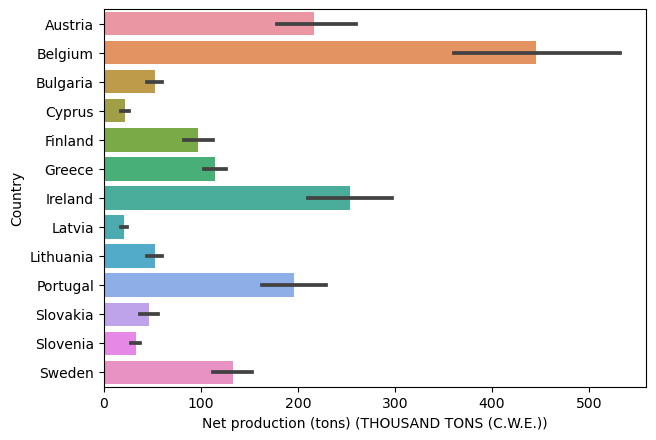

In [598]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams.update({'figure.figsize':(7,5), 'figure.dpi':100})
sns.barplot(x='Net production (tons) (THOUSAND TONS (C.W.E.))',y='Country',data=df10);

In [599]:
# Data Type of each variable.
df10.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1040 entries, 0 to 2159
Data columns (total 16 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   Year                                                  1040 non-null   int64  
 1   Country                                               1040 non-null   object 
 2   Commodity                                             1040 non-null   object 
 3   Apparent use (THOUSAND TONS (C.W.E.))                 1040 non-null   float64
 4   Carcass weight (KG/HEAD)                              1040 non-null   float64
 5   Gross indigenous production (THOUSAND TONS (C.W.E.))  1040 non-null   float64
 6   Live exports (Extra-EU) (THOUSAND TONS (C.W.E.))      1040 non-null   float64
 7   Live exports (Intra-EU) (THOUSAND TONS (C.W.E.))      1040 non-null   float64
 8   Live imports (Extra-EU) (THOUSAND TONS (C.W.E.))      1040

***Central Tendency Measures***

These measures will allow us to summarize in a single number all the values reflecting the centre of the data distribution

***Variation Measures***

These measures help us to get values that determine the level of homogeneity within the observations.

In other words, we can see how different/similar the values are.

In [600]:
# df.describe is a way to summarize the data using Descriptive Statistics: 
#Central Tendency and Measures of variability for Numerical features (except Station ID and Latitude and Longitue)
# I am Using .round() to suppress scientific notation.
df10.describe(include=['int64','float64']).round()

,Year,Apparent use (THOUSAND TONS (C.W.E.)),Carcass weight (KG/HEAD),Gross indigenous production (THOUSAND TONS (C.W.E.)),Live exports (Extra-EU) (THOUSAND TONS (C.W.E.)),Live exports (Intra-EU) (THOUSAND TONS (C.W.E.)),Live imports (Extra-EU) (THOUSAND TONS (C.W.E.)),Live imports (Intra-EU) (THOUSAND TONS (C.W.E.)),Meat exports (Extra-EU) (THOUSAND TONS (C.W.E.)),Meat exports (Intra-EU) (THOUSAND TONS (C.W.E.)),Meat imports (Extra-EU) (THOUSAND TONS (C.W.E.)),Meat imports (Intra-EU) (THOUSAND TONS (C.W.E.)),Net production (heads) (THOUSAND HEAD),Net production (tons) (THOUSAND TONS (C.W.E.))
count,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0
mean,2012.0,126.0,92.0,128.0,1.0,4.0,0.0,7.0,18.0,41.0,5.0,51.0,22945.0,129.0
std,6.0,123.0,110.0,183.0,4.0,11.0,0.0,18.0,45.0,111.0,11.0,60.0,53079.0,187.0
min,2002.0,0.0,1.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,0.0
25%,2007.0,20.0,6.0,21.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,4.0,256.0,18.0
50%,2012.0,95.0,43.0,72.0,0.0,0.0,0.0,0.0,1.0,8.0,1.0,22.0,1001.0,70.0
75%,2016.0,187.0,111.0,146.0,0.0,3.0,0.0,3.0,11.0,24.0,4.0,82.0,11864.0,147.0
max,2021.0,492.0,578.0,1138.0,35.0,103.0,4.0,150.0,308.0,792.0,82.0,275.0,309118.0,1140.0


In [601]:
# Using df.describe to get summary statistics for objects
df10.describe(include=np.object)

,Country,Commodity
count,1040,1040
unique,13,4
top,Austria,BOVINE
freq,80,260


In [602]:
# Using EDA Dataprep to create a full report about the Dataset.
# As this can take longer and require some libraries being installed the report will be also supplied as HTLM and PDF to facilitate.
# To create the report please re-run the below line removing the #

  0%|          | 0/3141 [00:00<?, ?it/s]

E-1019 (DUPLICATE_FACTORS): FactorRange must specify a unique list of categorical factors for an axis: duplicate factors found: 'Live exports ....))', 'Live imports ....))', 'Meat exports ....))', 'Meat imports ....))'



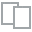
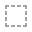
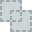
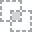
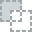
...
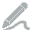
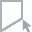
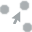
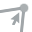
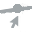

In [603]:
create_report(df10).show()

Dataset Insights

We have **no Missing Data** in any feature

**STATUS** feature has constant value "Open"   (does not add value to analysis)

**STATION ID** is a unique identifier of each Station (does not add value to analysis)

**ADDRESS** has a high cardinality: 109 distinct values (does not add value to analysis once we have Lat and Long)

**AVAILABLE BIKES** is the only feature that presents outliers (around 1% of the values are considered outliers), however I could not find any values over 40 as that is the maximum possible value once there are no Bike stations with more than 40 stands.

It was not possible to find evidence of errors since in none of the observations the number of bicycles available at the station was greater than the total number of Stands.
For that reason I am going to consider the outliers acceptable and part of the nature of the operation of the business.

**AVAILABLE BIKE STANDS** is skewed but close to Normal Distribution.

## Statistics Questions

In [604]:
df10

,Year,Country,Commodity,Apparent use (THOUSAND TONS (C.W.E.)),Carcass weight (KG/HEAD),Gross indigenous production (THOUSAND TONS (C.W.E.)),Live exports (Extra-EU) (THOUSAND TONS (C.W.E.)),Live exports (Intra-EU) (THOUSAND TONS (C.W.E.)),Live imports (Extra-EU) (THOUSAND TONS (C.W.E.)),Live imports (Intra-EU) (THOUSAND TONS (C.W.E.)),Meat exports (Extra-EU) (THOUSAND TONS (C.W.E.)),Meat exports (Intra-EU) (THOUSAND TONS (C.W.E.)),Meat imports (Extra-EU) (THOUSAND TONS (C.W.E.)),Meat imports (Intra-EU) (THOUSAND TONS (C.W.E.)),Net production (heads) (THOUSAND HEAD),Net production (tons) (THOUSAND TONS (C.W.E.))
0,2002,Austria,BOVINE,150.230876,299.546142,221.668323,1.519472,11.760207,0.000000,3.471356,16.757085,55.991175,0.102140,11.016996,707.270000,211.860000
1,2003,Austria,BOVINE,147.146140,303.832397,217.864637,2.158318,12.495831,0.000000,4.899512,9.201370,64.825500,0.402660,12.660350,684.950000,208.110000
2,2004,Austria,BOVINE,136.276934,306.036465,214.087118,2.677365,12.945268,0.009130,7.816385,9.631965,73.198990,0.142670,12.675219,674.070000,206.290000
3,2005,Austria,BOVINE,143.325801,311.445341,208.223687,2.583296,14.606232,0.006534,12.719307,5.079205,73.382565,0.111795,17.915776,654.240000,203.760000
4,2006,Austria,BOVINE,149.743905,314.283203,225.468730,3.059186,16.224407,0.010588,8.384275,6.473250,79.464270,0.132870,20.968555,682.760000,214.580000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2155,2017,Sweden,SHEEP AND GOATS,24.280400,20.299524,5.711000,0.000046,0.000001,0.000000,0.009047,0.028865,0.215199,3.587991,15.216473,281.780000,5.720000
2156,2018,Sweden,SHEEP AND GOATS,19.809945,20.149279,6.015638,0.000226,0.000010,0.000000,0.004598,0.034468,0.161958,3.433719,10.552652,298.770000,6.020000
2157,2019,Sweden,SHEEP AND GOATS,18.579843,20.403662,5.540064,0.000006,0.000000,0.000000,0.009942,0.035986,0.119669,2.000873,11.184625,272.010000,5.550000
2158,2020,Sweden,SHEEP AND GOATS,18.244682,20.429443,5.276934,0.000022,0.000000,0.000000,0.013088,0.005663,0.142567,2.221079,10.881833,258.940000,5.290000


In [605]:
df10.rename(columns = {"Apparent use (THOUSAND TONS (C.W.E.))":'Apparent_use_THOUSAND_TONS_CWE', 
                       "Carcass weight (KG/HEAD)": "Carcass_weight_KG/HEAD",
                       "Gross indigenous production (THOUSAND TONS (C.W.E.))":"Gross_indigenous_production_THOUSAND_TONS_CWE",
                       "Live exports (Extra-EU) (THOUSAND TONS (C.W.E.))":"Live_exports_Extra_EU_THOUSAND_TONS_CWE",
                       "Live exports (Intra-EU) (THOUSAND TONS (C.W.E.))":"Live_exports_Intra_EU_THOUSAND_TONS_CWE",
                       "Live imports (Extra-EU) (THOUSAND TONS (C.W.E.))":"Live_imports_Extra_EU_THOUSAND_TONS_CWE",
                       "Live imports (Intra-EU) (THOUSAND TONS (C.W.E.))":"Live_imports_Intra_EU_THOUSAND_TONS_CWE",
                       "Meat exports (Extra-EU) (THOUSAND TONS (C.W.E.))":"Meat_exports_Extra_EU_THOUSAND_TONS_CWE",
                       "Meat exports (Intra-EU) (THOUSAND TONS (C.W.E.))":"Meat_exports_Intra_EU_THOUSAND_TONS_CWE",
                       "Meat imports (Extra-EU) (THOUSAND TONS (C.W.E.))":"Meat_imports_Extra_EU_THOUSAND_TONS_CWE",
                       "Meat imports (Intra-EU) (THOUSAND TONS (C.W.E.))":"Meat_imports_Intra_EU_THOUSAND_TONS_CWE",
                       "Net production (heads) (THOUSAND HEAD)":"Net_production_heads_THOUSAND_EAD",
                       "Net production (tons) (THOUSAND TONS (C.W.E.))":"Net_production_tons_THOUSAND_TONS_CWE"
                          }, inplace = True)

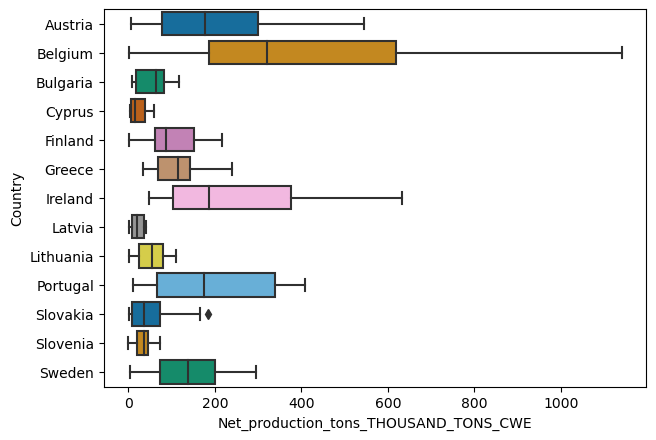

In [609]:
sns.boxplot(x="Net_production_tons_THOUSAND_TONS_CWE", y='Country', data=df10,palette="colorblind");

In [610]:
countries= ["Ireland","Portugal","Austria"]
df_comparison = df10[df10.Country.isin(countries)]

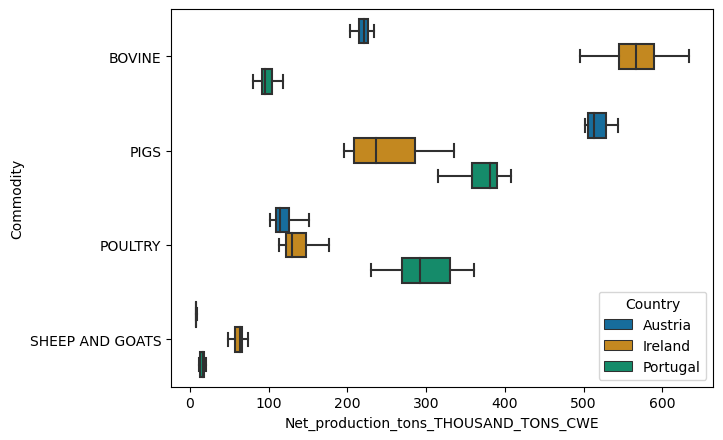

In [611]:
sns.boxplot(x="Net_production_tons_THOUSAND_TONS_CWE", y='Commodity',hue="Country",
            data=df_comparison,palette="colorblind");

### Shapiro Test

The Shapiro-Wilk test examines if a variable is normally distributed in some population.

In [612]:
# Building subsets 
df_IRE = df10[df10["Country"]=="Ireland"]

Setting 4 hypotheses test to check about the distribution for the Irish subset for each commodity.

**Ho**: Sample of Bovine is from the normal distributions.(P>0.05)\
**Ha**: Sample of Bovine is not from the normal distributions.


**Ho**: Sample of Pigs is from the normal distributions.(P>0.05)\
**Ha**: Sample of Pigs is not from the normal distributions.


**Ho**: Sample of Poultry is from the normal distributions.(P>0.05)\
**Ha**: Sample of Poultry is not from the normal distributions.


**Ho**: Sample of Sheep and Goats is from the normal distributions.(P>0.05)\
**Ha**: Sample of Sheep and Goats is not from the normal distributions.

In [613]:
#Shapiro wilk test
for i in ["BOVINE","PIGS","POULTRY","SHEEP AND GOATS"]:
     print(i + ": " + str(stats.shapiro(df_IRE.Net_production_tons_THOUSAND_TONS_CWE[df_IRE.Commodity == i])))

BOVINE: ShapiroResult(statistic=0.9765170812606812, pvalue=0.8816961050033569)
PIGS: ShapiroResult(statistic=0.8979106545448303, pvalue=0.03768857568502426)
POULTRY: ShapiroResult(statistic=0.8904536962509155, pvalue=0.027413763105869293)
SHEEP AND GOATS: ShapiroResult(statistic=0.9555279016494751, pvalue=0.45880091190338135)


The output confirmed only PIGS and POULTRY sample are from a normal distribution.

Ho ✅ (<span style="color:green">Accepted</span>): Sample of Bovine is from the normal distributions.(P>0.05)\
Ha ❌ (<span style="color:red">Rejected</span>): Sample of Bovine is not from the normal distributions.


Ho ❌ (<span style="color:red">Rejected</span>): Sample of Pigs is from the normal distributions.(P>0.05)\
Ha ✅ (<span style="color:green">Accepted</span>): Sample of Pigs is not from the normal distributions.


Ho ❌ (<span style="color:red">Rejected</span>): Sample of Poultry is from the normal distributions.(P>0.05)\
Ha ✅ (<span style="color:green">Accepted</span>): Sample of Poultry is not from the normal distributions.


Ho ❌ (<span style="color:red">Rejected</span>): Sample of Sheep and Goats is from the normal distributions.(P>0.05)\
Ha ✅ (<span style="color:green">Accepted</span>): Sample of Sheep and Goats is not from the normal distributions.


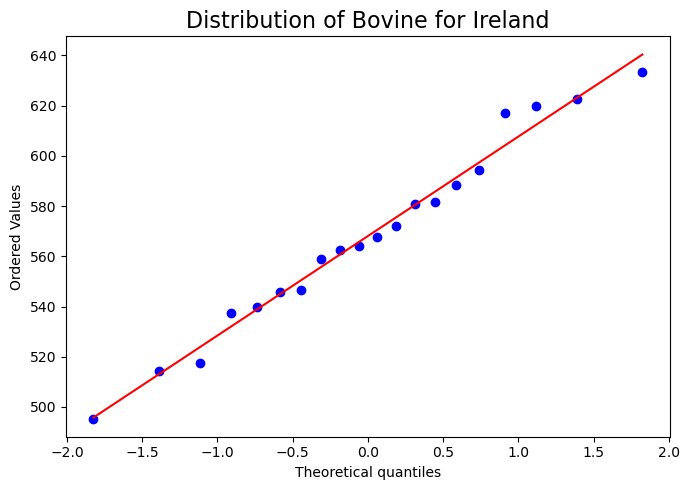

In [614]:
#Normality plot of Irish commodit Bovine"
stats.probplot(df_IRE.Net_production_tons_THOUSAND_TONS_CWE[df_IRE.Commodity =="BOVINE"], plot=plt);
pt.title('Distribution of Bovine for Ireland',color="black", size=16)
pt.tight_layout()

In [618]:
df_AUS = df10[df10["Country"]=="Austria"]

Setting 4 hypotheses test to check about the distribution for the Swedish subset for each commodity.

**Ho**: Sample of Bovine is from the normal distributions.(P>0.05)\
**Ha**: Sample of Bovine is not from the normal distributions.


**Ho**: Sample of Pigs is from the normal distributions.(P>0.05)\
**Ha**: Sample of Pigs is not from the normal distributions.


**Ho**: Sample of Poultry is from the normal distributions.(P>0.05)\
**Ha**: Sample of Poultry is not from the normal distributions.


**Ho**: Sample of Sheep and Goats is from the normal distributions.(P>0.05)\
**Ha**: Sample of Sheep and Goats is not from the normal distributions.

In [619]:
#Shapiro wilk test
for i in ["BOVINE","PIGS","POULTRY","SHEEP AND GOATS"]:
     print(i + ": " + str(stats.shapiro(df_AUS.Net_production_tons_THOUSAND_TONS_CWE[df_AUS.Commodity == i])))

BOVINE: ShapiroResult(statistic=0.9654181599617004, pvalue=0.6566981673240662)
PIGS: ShapiroResult(statistic=0.9023046493530273, pvalue=0.04556182771921158)
POULTRY: ShapiroResult(statistic=0.8995003700256348, pvalue=0.04035911336541176)
SHEEP AND GOATS: ShapiroResult(statistic=0.9559043645858765, pvalue=0.46560555696487427)


For Sweden, the output confirmed that BOVINE, PIGS and POULTRY samples are from a normal distribution.

Ho ✅ (<span style="color:green">Accepted</span>): Sample of Bovine is from the normal distributions.(P>0.05)\
Ha ❌ (<span style="color:red">Rejected</span>): Sample of Bovine is not from the normal distributions.


Ho ❌ (<span style="color:red">Rejected</span>): Sample of Pigs is from the normal distributions.(P>0.05)\
Ha ✅ (<span style="color:green">Accepted</span>): Sample of Pigs is not from the normal distributions.


Ho ❌ (<span style="color:red">Rejected</span>): Sample of Poultry is from the normal distributions.(P>0.05)\
Ha ✅ (<span style="color:green">Accepted</span>): Sample of Poultry is not from the normal distributions.


Ho ✅ (<span style="color:green">Accepted</span>): Sample of Sheep and Goats is from the normal distributions.(P>0.05)\
Ha ❌ (<span style="color:red">Rejected</span>): Sample of Sheep and Goats is not from the normal distributions.

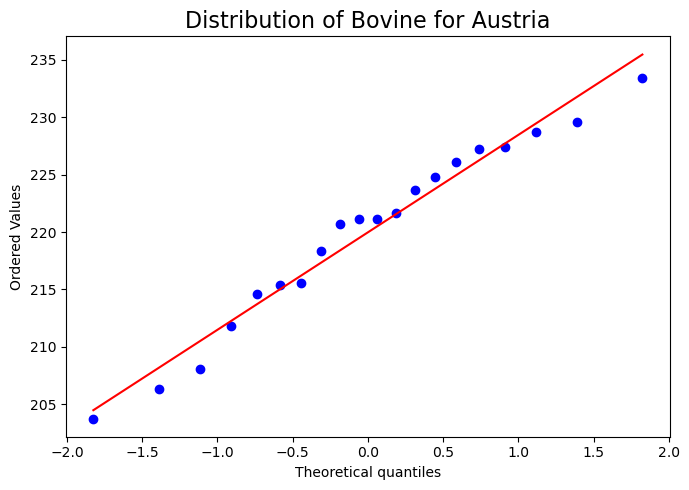

In [620]:
#visualise the distribution of Bovine for Austria subset (Normal Distributed)
stats.probplot(df_AUS.Net_production_tons_THOUSAND_TONS_CWE[df_AUS.Commodity =="BOVINE"], plot=plt);
pt.title('Distribution of Bovine for Austria',color="black", size=16)
pt.tight_layout()

Comparing two non parametric groups

In [621]:
# Building subsets 
df_PTO = df10[df10["Country"]=="Portugal"]

Setting 4 hypotheses test to check about the distribution for the Irish subset for each commodity.

**Ho**: Sample of Bovine is from the normal distributions.(P>0.05)\
**Ha**: Sample of Bovine is not from the normal distributions.


**Ho**: Sample of Pigs is from the normal distributions.(P>0.05)\
**Ha**: Sample of Pigs is not from the normal distributions.


**Ho**: Sample of Poultry is from the normal distributions.(P>0.05)\
**Ha**: Sample of Poultry is not from the normal distributions.


**Ho**: Sample of Sheep and Goats is from the normal distributions.(P>0.05)\
**Ha**: Sample of Sheep and Goats is not from the normal distributions.

In [622]:
#Shapiro wilk test
for i in ["BOVINE","PIGS","POULTRY","SHEEP AND GOATS"]:
     print(i + ": " + str(stats.shapiro(df_PTO.Net_production_tons_THOUSAND_TONS_CWE[df_PTO.Commodity == i])))

BOVINE: ShapiroResult(statistic=0.9523159861564636, pvalue=0.40361833572387695)
PIGS: ShapiroResult(statistic=0.8788883090019226, pvalue=0.016897428780794144)
POULTRY: ShapiroResult(statistic=0.9448164701461792, pvalue=0.2951621115207672)
SHEEP AND GOATS: ShapiroResult(statistic=0.8884308934211731, pvalue=0.025166984647512436)


For Portugal, the output confirmed that BOVINE, and POULTRY samples are from a normal distribution.

Ho ✅ (<span style="color:green">Accepted</span>): Sample of Bovine is from the normal distributions.(P>0.05)\
Ha ❌ (<span style="color:red">Rejected</span>): Sample of Bovine is not from the normal distributions.


Ho ❌ (<span style="color:red">Rejected</span>): Sample of Pigs is from the normal distributions.(P>0.05)\
Ha ✅ (<span style="color:green">Accepted</span>): Sample of Pigs is not from the normal distributions.


Ho ✅ (<span style="color:green">Accepted</span>): Sample of Poultry is from the normal distributions.(P>0.05)\
Ha ❌ (<span style="color:red">Rejected</span>):: Sample of Poultry is not from the normal distributions.


Ho ❌ (<span style="color:red">Rejected</span>): Sample of Sheep and Goats is from the normal distributions.(P>0.05)\
Ha ✅ (<span style="color:green">Accepted</span>): Sample of Sheep and Goats is not from the normal distributions.

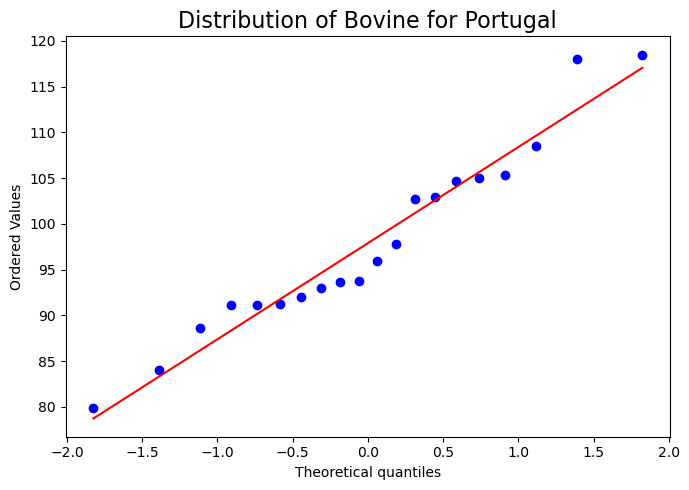

In [623]:
#visualise the distribution of Bovine for Sweden subset (Normal Distributed)
stats.probplot(df_PTO.Net_production_tons_THOUSAND_TONS_CWE[df_PTO.Commodity =="BOVINE"], plot=plt);
pt.title('Distribution of Bovine for Portugal',color="black", size=16)
pt.tight_layout()

### Bartlett's for testing variance

Bartlett’s test is used to check whether all samples have the same variance. 

Also know as test for homogeneity. 

It’s utilized when the data is almost certainly from a Gaussian distribution or normal distribution

In this case this test can be use as Bovine has a normal distribution for all three countries.

There is a considerable variation in variances if the Bartlett test statistic is bigger than this critical value.

There is no significant difference if the Bartlett test statistic is smaller than this critical value.

This is a hypotheses test and the two hypotheses are as follows:

**Ho**: The groups have equal variance.(P>0.05)\
**Ha**: One group has a different variance compared to the others.

In [624]:
bovine_Ireland = df_IRE.Net_production_tons_THOUSAND_TONS_CWE[df_IRE.Commodity == "BOVINE"]
bovine_Austria = df_SWE.Net_production_tons_THOUSAND_TONS_CWE[df_AUS.Commodity == "BOVINE"]
bovine_Portugal = df_PTO.Net_production_tons_THOUSAND_TONS_CWE[df_PTO.Commodity == "BOVINE"]

In [629]:
#Homogeinity of variance: Bartlett's test
import scipy.stats as stats
test_statistic, p_value = stats.bartlett(bovine_Ireland,bovine_Austria, bovine_Portugal)
print(test_statistic, p_value)

50.7629565265463 9.483399534354658e-12


Ho ❌ (<span style="color:red">Rejected</span>): The groups have equal variance.(P>0.05)\
Ha ✅ (<span style="color:green">Accepted</span>): One group has a different variance compared to the others.

Achar a diferenca

### T-Test

T-Test is a hypothesis test used to test the equality of two population means.

This is a hypotheses test and the two hypotheses are as follows:

**Ho**: The means are equal.(P>0.05)\
**Ha**: The means are not equal.

In [631]:
print(stats.ttest_ind(bovine_Austria, bovine_Portugal).pvalue)

2.3403228185311313e-33


Ho ❌ (<span style="color:red">Rejected</span>): The means are equal.(P>0.05)\
Ha ✅ (<span style="color:green">Accepted</span>): Means are not equal.

In [632]:
countries= ["Portugal","Austria"]
df_comparison = df10[df10.Country.isin(countries)]

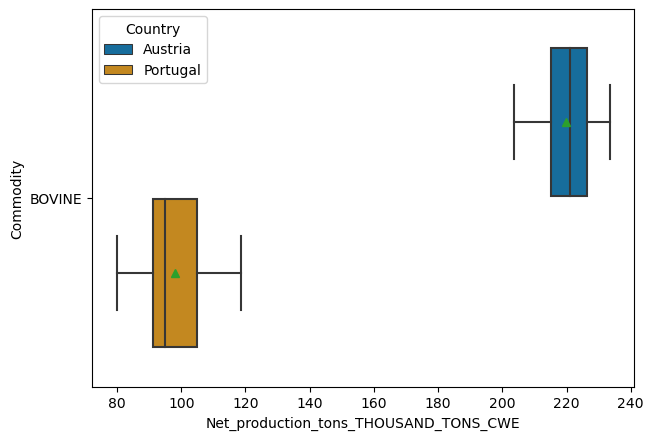

In [633]:
sns.boxplot(x="Net_production_tons_THOUSAND_TONS_CWE", y='Commodity',hue="Country",
            data=df_comparison[df_comparison["Commodity"]=="BOVINE"],palette="colorblind",showmeans=True);

## Classification Model

In [221]:
# Load libraries
import pandas as pd
import seaborn as sns
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import warnings
warnings.filterwarnings('ignore') # We can suppress the warnings

In [222]:
df10

,Year,Country,Commodity,Apparent use (THOUSAND TONS (C.W.E.)),Carcass weight (KG/HEAD),Gross indigenous production (THOUSAND TONS (C.W.E.)),Live exports (Extra-EU) (THOUSAND TONS (C.W.E.)),Live exports (Intra-EU) (THOUSAND TONS (C.W.E.)),Live imports (Extra-EU) (THOUSAND TONS (C.W.E.)),Live imports (Intra-EU) (THOUSAND TONS (C.W.E.)),Meat exports (Extra-EU) (THOUSAND TONS (C.W.E.)),Meat exports (Intra-EU) (THOUSAND TONS (C.W.E.)),Meat imports (Extra-EU) (THOUSAND TONS (C.W.E.)),Meat imports (Intra-EU) (THOUSAND TONS (C.W.E.)),Net production (heads) (THOUSAND HEAD),Net production (tons) (THOUSAND TONS (C.W.E.))
0,2002,Austria,BOVINE,150.230876,299.546142,221.668323,1.519472,11.760207,0.000000,3.471356,16.757085,55.991175,0.102140,11.016996,707.270000,211.860000
1,2003,Austria,BOVINE,147.146140,303.832397,217.864637,2.158318,12.495831,0.000000,4.899512,9.201370,64.825500,0.402660,12.660350,684.950000,208.110000
2,2004,Austria,BOVINE,136.276934,306.036465,214.087118,2.677365,12.945268,0.009130,7.816385,9.631965,73.198990,0.142670,12.675219,674.070000,206.290000
3,2005,Austria,BOVINE,143.325801,311.445341,208.223687,2.583296,14.606232,0.006534,12.719307,5.079205,73.382565,0.111795,17.915776,654.240000,203.760000
4,2006,Austria,BOVINE,149.743905,314.283203,225.468730,3.059186,16.224407,0.010588,8.384275,6.473250,79.464270,0.132870,20.968555,682.760000,214.580000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2155,2017,Sweden,SHEEP AND GOATS,24.280400,20.299524,5.711000,0.000046,0.000001,0.000000,0.009047,0.028865,0.215199,3.587991,15.216473,281.780000,5.720000
2156,2018,Sweden,SHEEP AND GOATS,19.809945,20.149279,6.015638,0.000226,0.000010,0.000000,0.004598,0.034468,0.161958,3.433719,10.552652,298.770000,6.020000
2157,2019,Sweden,SHEEP AND GOATS,18.579843,20.403662,5.540064,0.000006,0.000000,0.000000,0.009942,0.035986,0.119669,2.000873,11.184625,272.010000,5.550000
2158,2020,Sweden,SHEEP AND GOATS,18.244682,20.429443,5.276934,0.000022,0.000000,0.000000,0.013088,0.005663,0.142567,2.221079,10.881833,258.940000,5.290000


In [223]:
# Drop Categorical Variables
df10= df10.drop(["Commodity"],1)

As we have previously seen, our dataset is not very well balanced between the two classes 0 and 1 in our target variable. We are going to use a new technique of splitting the dataset into 85 % to be considered as known data and 15% unknown data (as we want to make sure the models are going to perform well in unknown data). 

We then perform a subsplit of the known data into an 80/20 train/test partition.

In [224]:
data = df10.sample(frac=0.9, random_state=786)
data_unseen = df10.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (936, 15)
Unseen Data For Predictions: (104, 15)


In [225]:
# split data for modelling into Train/Test partition 80/20
from sklearn.model_selection import train_test_split 
train, test = train_test_split(data,test_size = 0.30,random_state=1)

# split data for modelling in features and target variable
X_train = train.drop(['Country'],axis=1)
y_train = train.filter(['Country'])
X_test = test.drop(['Country'],axis=1)
y_test = test.filter(['Country'])

As the results above show, our Random Forest is overfitting with 100% acurracy for the Train partition and 96% for the Test partition.

In order to sort out the issue, we decided to do a grid search to improve the model using better hyperparameters and cross validation.

The below code has been used for this task, with the output generated detailing the best hyperparameters:

In [226]:
from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import GridSearchCV

rfc=RandomForestClassifier(random_state=42)

param_grid = {'n_estimators': [200,500,600],
              'max_features': ['auto', 'sqrt', 'log2'],
              'max_depth' : [4,6,8], 
              'criterion' :['gini', 'entropy']}

CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 10)

CV_rfc.fit(X_train, y_train)

print(CV_rfc.best_params_)

##### Output : {'criterion': 'entropy', 'max_depth': 8, 'max_features': 'auto', 'n_estimators': 500}

{'criterion': 'entropy', 'max_depth': 8, 'max_features': 'auto', 'n_estimators': 500}


In [227]:
CV_rfc = RandomForestClassifier(criterion='entropy',max_depth = 7, max_features ='auto', n_estimators=100, random_state =42)
CV_rfc.fit(X_train, y_train)

# re-making the predictions
y_pred= CV_rfc.predict(X_test)
X_pred= CV_rfc.predict(X_train)

from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy for the Test partition:",metrics.accuracy_score(y_test, y_pred))
print("Accuracy for the Train Partition:",metrics.accuracy_score(y_train, X_pred))

Accuracy for the Test partition: 0.9608540925266904
Accuracy for the Train Partition: 0.9984732824427481


The confusion matrix is a useful visualization tool that provides analysis on the true negative, false positive, false negative, and true positives made by our model. Beyond a simple accuracy metric, we should also look at the confusion matrix to understand the performance of the model.The definition of true negative, false positive, false negative, and true positives are as follows:

- True negative: Actual class is negative (Churn), and the model predicted negative (Churn)
- False positive: Actual class is negative (Churn), but the model predicted positive (Active Customers)
- False negative: Actual class is positive (Active Customers), but the model predicted negative (Churn)
- True positive: Actual class is positive (Active Customers), and the model predicted positive (Active Customers)

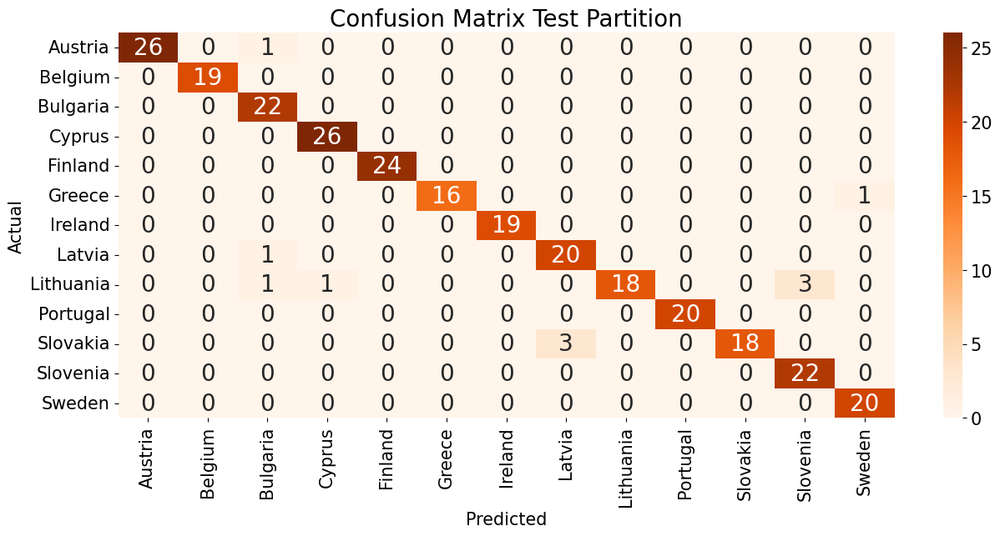

In [228]:
#Import Libriries
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline

# reset the configurations to default
plt.rcdefaults()
mpl.rcdefaults()

# change the fontsize of the xtick and ytick labels
plt.rc('xtick', labelsize=15)
plt.rc('ytick', labelsize=15)
plt.rc('axes', labelsize=15)
mpl.rcParams.update({'font.size': 20})
plt.rc('axes', titlesize=20)

#Selecting Data

data = {'Actual':    y_test['Country'],
        'Predicted': y_pred}

df = pd.DataFrame(data, columns=['Actual','Predicted'])
confusion_matrix = pd.crosstab(df['Actual'], df['Predicted'], rownames=['Actual'], colnames=['Predicted'])


#data2 = {'Actual':    y_train['Country'],
        #'Predicted': X_pred}

#df2 = pd.DataFrame(data2, columns=['Actual','Predicted'])
#confusion_matrix2 = pd.crosstab(df2['Actual'], df2['Predicted'], rownames=['Actual'], colnames=['Predicted'])

#f, ((ax1, ax2)) = plt.subplots(1,2, figsize=(15, 6), sharex=True, sharey=True)
f, (ax1) = plt.subplots(1, figsize=(15, 6), sharex=True)

_=sns.heatmap(confusion_matrix, annot=True, fmt='g', cmap='Oranges', ax=ax1) 
#_=sns.heatmap(confusion_matrix2, annot=True, fmt='g', cmap='Oranges', ax=ax2)
ax1.set_title('Confusion Matrix Test Partition');
#ax2.set_title('Confusion Matrix Train Partition');

Test Partition: We have got 195 true negatives and 1442 true positives and we have got 67 false positives and 18 false negatives.     
                      
Train Partition: We have got 968 true negatives and 5716 true positives and we have got 157 false positives and 45 false negatives. 

### Classification Reports

In [229]:
print("Classification Report for the Test partition:")
print(classification_report(y_test,y_pred))

Classification Report for the Test partition:
              precision    recall  f1-score   support

     Austria       1.00      0.96      0.98        27
     Belgium       1.00      1.00      1.00        19
    Bulgaria       0.88      1.00      0.94        22
      Cyprus       0.96      1.00      0.98        26
     Finland       1.00      1.00      1.00        24
      Greece       1.00      0.94      0.97        17
     Ireland       1.00      1.00      1.00        19
      Latvia       0.87      0.95      0.91        21
   Lithuania       1.00      0.78      0.88        23
    Portugal       1.00      1.00      1.00        20
    Slovakia       1.00      0.86      0.92        21
    Slovenia       0.88      1.00      0.94        22
      Sweden       0.95      1.00      0.98        20

    accuracy                           0.96       281
   macro avg       0.96      0.96      0.96       281
weighted avg       0.96      0.96      0.96       281



In [230]:
print("Classification Report for the Train partition:")
print(classification_report(y_train,X_pred))

Classification Report for the Train partition:
              precision    recall  f1-score   support

     Austria       1.00      1.00      1.00        47
     Belgium       1.00      1.00      1.00        53
    Bulgaria       1.00      1.00      1.00        53
      Cyprus       0.98      1.00      0.99        46
     Finland       1.00      1.00      1.00        51
      Greece       1.00      1.00      1.00        53
     Ireland       1.00      1.00      1.00        54
      Latvia       1.00      1.00      1.00        49
   Lithuania       1.00      0.98      0.99        55
    Portugal       1.00      1.00      1.00        48
    Slovakia       1.00      1.00      1.00        49
    Slovenia       1.00      1.00      1.00        46
      Sweden       1.00      1.00      1.00        51

    accuracy                           1.00       655
   macro avg       1.00      1.00      1.00       655
weighted avg       1.00      1.00      1.00       655



The above results suggest we got a balance improvement, 95% accuracy for the Test and 97% accuracy for the Train.

### Unknown Data: Implementation

In [231]:
# isolated the target variable
X_unseen = data_unseen.drop(['Country'],axis=1)
y_unseen = data_unseen.filter(['Country'])

In [232]:
#Predict the response for unseen dataset
y_unseen_pred = CV_rfc.predict(X_unseen)

In [233]:
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy for the Unknown Partition:",metrics.accuracy_score(y_unseen, y_unseen_pred))

Accuracy for the Unknown Partition: 0.9615384615384616


Excellent results, the model still has a similar performance with 95% Accuracy for unknown data.

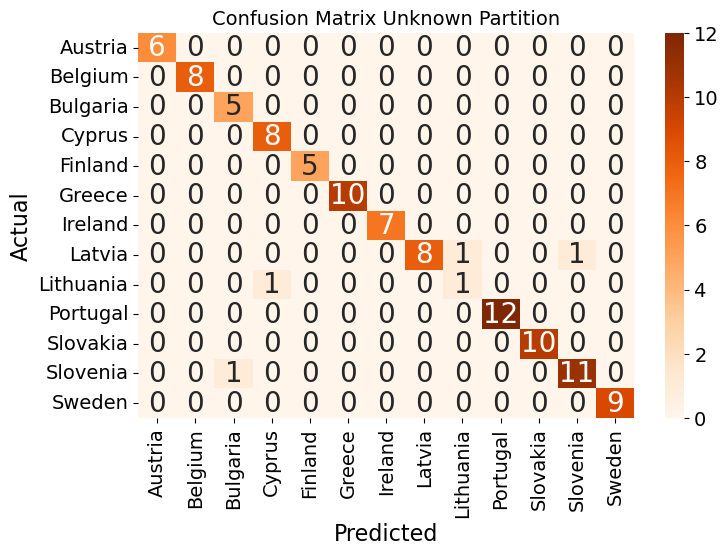

In [234]:
# Confusion matrix for the Unknown Partition
# reset the configurations to default
plt.rcdefaults()
mpl.rcdefaults()

# change the fontsize of the xtick and ytick labels
plt.rc('xtick', labelsize=14)
plt.rc('ytick', labelsize=14)
plt.rc('axes', labelsize=16)
mpl.rcParams.update({'font.size': 20})

#Selecting Data

data = {'Actual':    y_unseen['Country'],
        'Predicted': y_unseen_pred}

fig, ax = plt.subplots(figsize=(8,5))

df = pd.DataFrame(data, columns=['Actual','Predicted'])
confusion_matrix = pd.crosstab(df['Actual'], df['Predicted'], rownames=['Actual'], colnames=['Predicted'])
_ = sns.heatmap(confusion_matrix, annot=True, cmap='Oranges', fmt='g')

plt.rcParams.update({'font.size': 10})
plt.rc('axes', titlesize=14)
ax.set_title('Confusion Matrix Unknown Partition');

We have got 187 true negatives, 1260 true positives, 53 false positives and 19 false negatives. 

In [235]:
print("Classification Report for the Unknown Partition:")
print(classification_report(y_unseen,y_unseen_pred))

Classification Report for the Unknown Partition:
              precision    recall  f1-score   support

     Austria       1.00      1.00      1.00         6
     Belgium       1.00      1.00      1.00         8
    Bulgaria       0.83      1.00      0.91         5
      Cyprus       0.89      1.00      0.94         8
     Finland       1.00      1.00      1.00         5
      Greece       1.00      1.00      1.00        10
     Ireland       1.00      1.00      1.00         7
      Latvia       1.00      0.80      0.89        10
   Lithuania       0.50      0.50      0.50         2
    Portugal       1.00      1.00      1.00        12
    Slovakia       1.00      1.00      1.00        10
    Slovenia       0.92      0.92      0.92        12
      Sweden       1.00      1.00      1.00         9

    accuracy                           0.96       104
   macro avg       0.93      0.94      0.94       104
weighted avg       0.96      0.96      0.96       104



## Regression

In [236]:
df = df10
df

,Year,Country,Apparent use (THOUSAND TONS (C.W.E.)),Carcass weight (KG/HEAD),Gross indigenous production (THOUSAND TONS (C.W.E.)),Live exports (Extra-EU) (THOUSAND TONS (C.W.E.)),Live exports (Intra-EU) (THOUSAND TONS (C.W.E.)),Live imports (Extra-EU) (THOUSAND TONS (C.W.E.)),Live imports (Intra-EU) (THOUSAND TONS (C.W.E.)),Meat exports (Extra-EU) (THOUSAND TONS (C.W.E.)),Meat exports (Intra-EU) (THOUSAND TONS (C.W.E.)),Meat imports (Extra-EU) (THOUSAND TONS (C.W.E.)),Meat imports (Intra-EU) (THOUSAND TONS (C.W.E.)),Net production (heads) (THOUSAND HEAD),Net production (tons) (THOUSAND TONS (C.W.E.))
0,2002,Austria,150.230876,299.546142,221.668323,1.519472,11.760207,0.000000,3.471356,16.757085,55.991175,0.102140,11.016996,707.270000,211.860000
1,2003,Austria,147.146140,303.832397,217.864637,2.158318,12.495831,0.000000,4.899512,9.201370,64.825500,0.402660,12.660350,684.950000,208.110000
2,2004,Austria,136.276934,306.036465,214.087118,2.677365,12.945268,0.009130,7.816385,9.631965,73.198990,0.142670,12.675219,674.070000,206.290000
3,2005,Austria,143.325801,311.445341,208.223687,2.583296,14.606232,0.006534,12.719307,5.079205,73.382565,0.111795,17.915776,654.240000,203.760000
4,2006,Austria,149.743905,314.283203,225.468730,3.059186,16.224407,0.010588,8.384275,6.473250,79.464270,0.132870,20.968555,682.760000,214.580000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2155,2017,Sweden,24.280400,20.299524,5.711000,0.000046,0.000001,0.000000,0.009047,0.028865,0.215199,3.587991,15.216473,281.780000,5.720000
2156,2018,Sweden,19.809945,20.149279,6.015638,0.000226,0.000010,0.000000,0.004598,0.034468,0.161958,3.433719,10.552652,298.770000,6.020000
2157,2019,Sweden,18.579843,20.403662,5.540064,0.000006,0.000000,0.000000,0.009942,0.035986,0.119669,2.000873,11.184625,272.010000,5.550000
2158,2020,Sweden,18.244682,20.429443,5.276934,0.000022,0.000000,0.000000,0.013088,0.005663,0.142567,2.221079,10.881833,258.940000,5.290000


The computed Chi-Square statistic is 12480.0
The computed Chi-Square p value 0.4680434355129511
The degrees of freedom are 12468


The chi square statistic is 12480.00. The critical value for 12468 degrees of freedom at an alpha level of 0.05 is 12.59.


Small Paragraph mention the Y Variable to be predict

In [239]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1040 entries, 0 to 2159
Data columns (total 15 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   Year                                                  1040 non-null   int64  
 1   Country                                               1040 non-null   object 
 2   Apparent use (THOUSAND TONS (C.W.E.))                 1040 non-null   float64
 3   Carcass weight (KG/HEAD)                              1040 non-null   float64
 4   Gross indigenous production (THOUSAND TONS (C.W.E.))  1040 non-null   float64
 5   Live exports (Extra-EU) (THOUSAND TONS (C.W.E.))      1040 non-null   float64
 6   Live exports (Intra-EU) (THOUSAND TONS (C.W.E.))      1040 non-null   float64
 7   Live imports (Extra-EU) (THOUSAND TONS (C.W.E.))      1040 non-null   float64
 8   Live imports (Intra-EU) (THOUSAND TONS (C.W.E.))      1040

In [240]:
# Drop Categorical Variables
#df= df.drop(["Country","Commodity"],1)
#df = pd.get_dummies(data=df, drop_first=True)

### Correlation Matrix

Small Paragraph about Correlation Matrix to be add

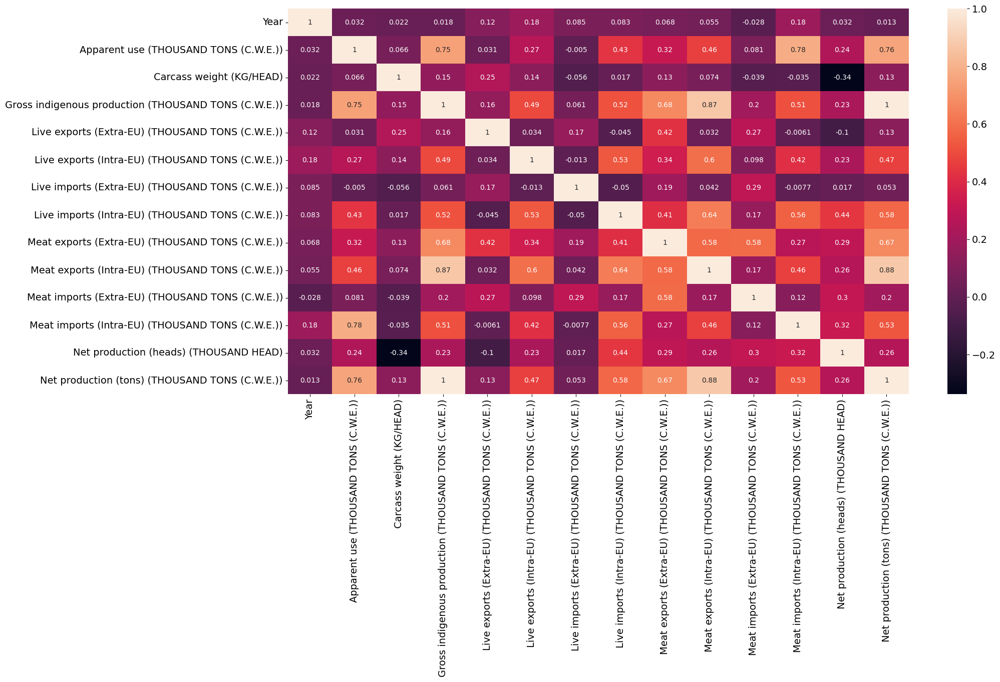

In [241]:
# Let's see the correlation matrix 
plt.figure(figsize = (20,10))        # Size of the figure
sns.heatmap(df.corr(),annot = True);

### Dropping highly correlated variables.

The variable ***Apparent use (THOUSAND TONS)*** is highly correlated with ***Production (THOUSAND TONS)*** this can cause Multicollinearity.

In order to avoid this problem the first one will be drop.

In [242]:
# Drop "Apparent use (THOUSAND TONS)"
df= df.drop(["Gross indigenous production (THOUSAND TONS (C.W.E.))","Country"],1)

### Split dependent and independent variable

In [243]:
# Putting feature variable to X
#X = pd.DataFrame(df["Exports (Intra-EU) (THOUSAND TONS)"])
X = df.drop(["Apparent use (THOUSAND TONS (C.W.E.))"],axis=1)

# Putting response variable to y
y = pd.DataFrame(df["Apparent use (THOUSAND TONS (C.W.E.))"])

### Scaling

In [244]:
column_names = list(X.columns)
y_column_name = list(y.columns)


from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
 
df_scaled = scaler.fit_transform(X)
y_scaled = scaler.fit_transform(y)

df_scaled = pd.DataFrame(df_scaled, columns= column_names)
y_scaled = pd.DataFrame(y_scaled, columns= y_column_name)

print("Scaled Dataset Using MinMaxScaler")
df_scaled.head()

Scaled Dataset Using MinMaxScaler


,Year,Carcass weight (KG/HEAD),Live exports (Extra-EU) (THOUSAND TONS (C.W.E.)),Live exports (Intra-EU) (THOUSAND TONS (C.W.E.)),Live imports (Extra-EU) (THOUSAND TONS (C.W.E.)),Live imports (Intra-EU) (THOUSAND TONS (C.W.E.)),Meat exports (Extra-EU) (THOUSAND TONS (C.W.E.)),Meat exports (Intra-EU) (THOUSAND TONS (C.W.E.)),Meat imports (Extra-EU) (THOUSAND TONS (C.W.E.)),Meat imports (Intra-EU) (THOUSAND TONS (C.W.E.)),Net production (heads) (THOUSAND HEAD),Net production (tons) (THOUSAND TONS (C.W.E.))
0,0.000000,0.517018,0.042835,0.114367,0.000000,0.023167,0.054371,0.070723,0.001244,0.040002,0.002261,0.185749
1,0.052632,0.524449,0.060844,0.121520,0.000000,0.032698,0.029855,0.081881,0.004904,0.045969,0.002189,0.182459
2,0.105263,0.528269,0.075476,0.125891,0.002199,0.052164,0.031253,0.092458,0.001737,0.046023,0.002154,0.180863
3,0.157895,0.537646,0.072824,0.142044,0.001573,0.084885,0.016480,0.092690,0.001361,0.065051,0.002089,0.178643
4,0.210526,0.542565,0.086240,0.157780,0.002550,0.055954,0.021004,0.100371,0.001618,0.076136,0.002182,0.188135


### Splitting Data into Training and Test Sets

In [245]:
from sklearn.model_selection import train_test_split
X = df_scaled
y = y_scaled

In [246]:
# Checking the Shape
X.shape, y.shape

((1040, 12), (1040, 1))

Using the `train_test_split()`function to split the set of observations into two halves, by selecting a random subset of 70% observations out of the original 1976 observations. 
Those observations are refer as the training set.

We'll use the `random_state` parameter in order to set a seed for
${\tt python}$’s random number generator, so that you'll obtain precisely the same results each time. It is generally a good idea to set a random seed when performing an analysis such as cross-validation
that contains an element of randomness, so that the results obtained can be reproduced precisely at a later time.

In [247]:
# Splitting the data into train and test using Randon_state 50
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.2,random_state=50)

We then use `LinearRegression()` to fit a linear regression to predict ***Production (THOUSAND TONS)*** from the other features using only the observations corresponding to the training set.

In [248]:
import sklearn.linear_model as skl_lm
lm = skl_lm.LinearRegression()
model = lm.fit(X_train, y_train)

Using the `predict()` function to estimate the response for the test observations, and `sklearn` to calculate the MSE `(Mean Square error)`.

In [249]:
pred = model.predict(X_test)

from sklearn.metrics import mean_squared_error
MSE = mean_squared_error(y_test, pred)
print('Mean square error score for this model is:', MSE)

Mean square error score for this model is: 7.587352840355835e-32


Therefore, the estimated test MSE for the linear regression fit is 0.0541.

We can use the `PolynomialFeatures()` function to estimate the test error for the polynomial quadratic and cubic regressions.

In [250]:
from sklearn.preprocessing import PolynomialFeatures

# Quadratic
poly = PolynomialFeatures(degree=2)
X_train2 = poly.fit_transform(X_train)
X_test2 = poly.fit_transform(X_test)

model = lm.fit(X_train2, y_train)
print('Mean square error score for this model is:',mean_squared_error(y_test, model.predict(X_test2)))

# Cubic
poly = PolynomialFeatures(degree=3)
X_train3 = poly.fit_transform(X_train)
X_test3 = poly.fit_transform(X_test)

model = lm.fit(X_train3, y_train)
print('Mean square error score for this model is:',mean_squared_error(y_test, model.predict(X_test3)))

Mean square error score for this model is: 2.853615566354291e-31
Mean square error score for this model is: 4.968013290487742e-27


These error rates are 0.1849 and 0.1625, respectively.

Another issues is that just by choosing a different training set instead, we will obtain different errors on the validation set. 

This can demonstrated by setting a different random seed:

In [251]:
# Linear
model = lm.fit(X_train, y_train)
print('Mean square error score for Linear model is:',mean_squared_error(y_test, model.predict(X_test)))

# Quadratic
poly = PolynomialFeatures(degree=2)
X_train2 = poly.fit_transform(X_train)
X_test2 = poly.fit_transform(X_test)

model = lm.fit(X_train2, y_train)
print('Mean square error score for quadratic model is:',mean_squared_error(y_test, model.predict(X_test2)))

# Cubic
poly = PolynomialFeatures(degree=3)
X_train3 = poly.fit_transform(X_train)
X_test3 = poly.fit_transform(X_test)

model = lm.fit(X_train3, y_train)
print('Mean square error score for cubic model is:',mean_squared_error(y_test, model.predict(X_test3)))

Mean square error score for Linear model is: 7.587352840355835e-32
Mean square error score for quadratic model is: 2.853615566354291e-31
Mean square error score for cubic model is: 4.968013290487742e-27


Using this split of the observations into a training set and a validation set, we find that the validation set error rates for the models with linear, quadratic, and cubic terms are 0.02201, 0.01876 , and 0.01763, respectively.

These results are not consistent with the previous findings.

Despite a model that predicts ***Production (THOUSAND TONS)*** using a cubic function of the other variables performs better than a model that involves only a linear function, and a quadratic function the MSE value increases substantially only because we have selected a different range for Training and Test when we change the random seed from 50 to 2.

In order to avoid such a great variance Cross Validation is a good approach.

As the data set is not too large Leave One Out Cross Validation suit us.

## Leave-One-Out Cross-Validation

The LOOCV estimate can be automatically computed for any generalized linear model using the `LeaveOneOut()` and `KFold()` functions.

In [252]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import LeaveOneOut

loo = LeaveOneOut()
X = pd.DataFrame(X).values.reshape(-1,12)
y = pd.DataFrame(y).values.reshape(-1,1)
loo.get_n_splits(X)

from sklearn.model_selection import KFold

crossvalidation = KFold(n_splits=1040, random_state=None, shuffle=False)

scores = cross_val_score(model, X, y, scoring="neg_mean_squared_error", cv=crossvalidation, n_jobs=1)

print("Folds: " + str(len(scores)) + ", MSE: " + str(np.mean(np.abs(scores))) + ", STD: " + str(np.std(scores)))


Folds: 1040, MSE: 1.336420365304937e-31, STD: 3.309177503813192e-31


The cross-validation estimate for the test error is approximately 0.01824

The question now would be : Is it the Cubic polynomial the best one for this problem ?

This procedure can be repeated for increasingly complex polynomial fits.

To automate the process, we use the `for()` function to initiate a for loop which iteratively fits polynomial regressions for polynomials of order `i = 1` to `i = 6` and computes the associated cross-validation error.

In [253]:
from sklearn.preprocessing import PolynomialFeatures
for i in range(1,3):
    poly = PolynomialFeatures(degree=i)
    X_current = poly.fit_transform(X)
    model = lm.fit(X_current, y)
    scores = cross_val_score(model, X_current, y, scoring="neg_mean_squared_error", cv=crossvalidation, n_jobs=1)
    
    print("Degree-"+str(i)+" polynomial MSE: " + str(np.mean(np.abs(scores))) + ", STD: " + str(np.std(scores)))
    

Degree-1 polynomial MSE: 1.3728714045477397e-31, STD: 2.9109057276000594e-31
Degree-2 polynomial MSE: 4.092713271264753e-31, STD: 1.2219790736698543e-30


The above output confirmed a drop in the estimated test MSE between the quadratic and cubic fits, but then no clear improvement from using higher-order polynomials was observed, adding complexity the models starts to perform poorly.

### Removing Outliers

In [254]:
from sklearn.ensemble import IsolationForest
from sklearn import model_selection
model = IsolationForest(random_state=47)

#X = X.values.reshape(-1,5)
#y = y.values.reshape(-1,1)

param_grid = {'n_estimators': [1000, 1500], 
              'max_samples': [50], 
              'contamination': ['auto'], 
              'max_features': [1, 4], 
              'bootstrap': [True], 
              'n_jobs': [-1]}

grid_search = model_selection.GridSearchCV(model, 
                                           param_grid,
                                           scoring="neg_mean_squared_error", 
                                           refit=True,
                                           cv=5, 
                                           return_train_score=True)
grid_search.fit(X, y)

best_model = grid_search.fit(X, y)
print('Optimum parameters', best_model.best_params_)

Optimum parameters {'bootstrap': True, 'contamination': 'auto', 'max_features': 4, 'max_samples': 50, 'n_estimators': 1500, 'n_jobs': -1}


In [255]:
#from pylab import savefig
from sklearn.ensemble import IsolationForest

#X = df_scaled.drop(["Imports (Intra-EU) (THOUSAND TONS)"],axis=1).values.reshape(-1,5)
#y = df_scaled["Imports (Intra-EU) (THOUSAND TONS)"].values.reshape(-1,1)

out_IF = IsolationForest(bootstrap = True, contamination= "auto", 
                         max_features = 1, max_samples= 50, 
                         n_estimators= 1000, n_jobs= 1).fit_predict(X)

outliers   = X[out_IF != 1, :]
X_w_out    = X[out_IF == 1, :]
y_w_out    = y[out_IF == 1, :]

print("Number of outiler: %i"% outliers.shape[0])
print("Number of observations less outiler: %i"% X_w_out.shape[0])
print("Number of Y observations less outiler: %i"% y_w_out.shape[0])

Number of outiler: 211
Number of observations less outiler: 829
Number of Y observations less outiler: 829


In [256]:
loo = LeaveOneOut()
X = X_w_out
y = y_w_out
loo.get_n_splits(X)

model = lm.fit(X,y)

from sklearn.model_selection import KFold

crossvalidation = KFold(n_splits=821, random_state=None, shuffle=False)

scores = cross_val_score(model, X, y, scoring="neg_mean_squared_error", cv=crossvalidation, n_jobs=1)

print("Folds: " + str(len(scores)) + ", MSE: " + str(np.mean(np.abs(scores))) + ", STD: " + str(np.std(scores)))


Folds: 821, MSE: 4.8989997483874027e-32, STD: 1.153681542531861e-31


In [257]:
from sklearn.preprocessing import PolynomialFeatures
for i in range(1,3):
    poly = PolynomialFeatures(degree=i)
    X_current = poly.fit_transform(X)
    model = lm.fit(X_current, y)
    scores = cross_val_score(model, X_current, y, scoring="neg_mean_squared_error", cv=crossvalidation, n_jobs=1)
    
    print("Degree-"+str(i)+" polynomial MSE: " + str(np.mean(np.abs(scores))) + ", STD: " + str(np.std(scores)))

Degree-1 polynomial MSE: 6.607674012370731e-32, STD: 1.561920179195405e-31
Degree-2 polynomial MSE: 7.830461114529864e-31, STD: 1.3079800492943022e-30


In [258]:
# Cubic
poly = PolynomialFeatures(degree=3)
X_cubic= poly.fit_transform(X)
model = lm.fit(X_cubic, y)

In [259]:
pred = model.predict(X_cubic)

from sklearn.metrics import mean_absolute_percentage_error
MSE = mean_squared_error(y, pred)
print('Mean square error score for this model is:', MSE)

Mean square error score for this model is: 1.124648917639017e-30


In [260]:
print(mean_absolute_percentage_error(y, pred))

0.0009800965018882995


In [261]:
y_reverse = scaler.inverse_transform(y).reshape(-1,)
pre_reverse = scaler.inverse_transform(pred).reshape(-1,)

In [262]:
df = pd.Series(y_reverse,pre_reverse)
df

134.728338    134.728338
130.514231    130.514231
148.552839    148.552839
148.561332    148.561332
146.913507    146.913507
                 ...    
24.280400      24.280400
19.809945      19.809945
18.579843      18.579843
18.244682      18.244682
17.013720      17.013720
Length: 829, dtype: float64

## Conclusion

Upon review, I found that the CRISP_DM framework is an excellent tool to keep focus on the tasks at hand and I will seek to make use of this in future projects. 

Prior to signing off on this project, reassessments were made to ensure that all proposals and objectives initially addressed were met and that all questions were answered appropriately with sufficient evidence and rationale for decisions made . 

It is evident that Data Science applied in any dataset can help us to better understand the world and make better decisions as human beings, with a mindset of recognising the impacts for future generations.

Some points to highlight regarding this assessment is the importance of:
•	having a good methodology. 
•	having the right tools available.
•	discipline for reading, researching, and developing skills and the necessary knowledge in Programming, Statistics, Data Preparation, Machine Learning and Data Visualization.

With the project findings presented, it is clear that further research could be made to progress more about the topic. There are clearly some correlations between the different groups of Dublin Bike Stations and maybe opportunities for a better distribution of the Bikes among the stations to improve the service provided. This might become a topic for future discussions.



df.sort_values(by=["Year"],inplace=True)
import plotly.express as px
fig = px.choropleth(df, locations="Alpha-3 code",
                    color="Apparent use (THOUSAND TONS (C.W.E.))", 
                    hover_name="Country", 
                    # column to add to hover information
                    animation_frame="Year", 
                    # column on which to animate
                    color_continuous_scale=px.colors.sequential.Plasma)
                    
fig.update_layout(
    # add a title text for the plot
    title_text = 'Internet usage across the world (% population)',
    # set projection style for the plot
    geo_scope = 'europe'
)
fig.show()

## References: